<a href="https://colab.research.google.com/github/Vaisakh-Babu/pandas_practice/blob/master/FordgoBike.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import pandas as pd
import numpy as np

# FordGoBike
FordGoBike(Bay Wheels) is a regional public bicycle sharing system in the San Francisco Bay Area, California operated by Motivate in a partnership with the Metropolitan Transportation Commission and the Bay Area Air Quality Management District

## Problem Statement
1. To understand supply damand gap
2. To understand most common routes


In [0]:
df = pd.read_csv('https://s3.amazonaws.com/fordgobike-data/2017-fordgobike-tripdata.csv')

In [71]:
df.head()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender
0,80110,2017-12-31 16:57:39.6540,2018-01-01 15:12:50.2450,74,Laguna St at Hayes St,37.776435,-122.426244,43,San Francisco Public Library (Grove St at Hyde...,37.778768,-122.415929,96,Customer,1987.0,Male
1,78800,2017-12-31 15:56:34.8420,2018-01-01 13:49:55.6170,284,Yerba Buena Center for the Arts (Howard St at ...,37.784872,-122.400876,96,Dolores St at 15th St,37.766210,-122.426614,88,Customer,1965.0,Female
2,45768,2017-12-31 22:45:48.4110,2018-01-01 11:28:36.8830,245,Downtown Berkeley BART,37.870348,-122.267764,245,Downtown Berkeley BART,37.870348,-122.267764,1094,Customer,NaN,NaN
3,62172,2017-12-31 17:31:10.6360,2018-01-01 10:47:23.5310,60,8th St at Ringold St,37.774520,-122.409449,5,Powell St BART Station (Market St at 5th St),37.783899,-122.408445,2831,Customer,NaN,NaN
4,43603,2017-12-31 14:23:14.0010,2018-01-01 02:29:57.5710,239,Bancroft Way at Telegraph Ave,37.868813,-122.258764,247,Fulton St at Bancroft Way,37.867789,-122.265896,3167,Subscriber,1997.0,Female


In [72]:
df.shape

(519700, 15)

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 519700 entries, 0 to 519699
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   duration_sec             519700 non-null  int64  
 1   start_time               519700 non-null  object 
 2   end_time                 519700 non-null  object 
 3   start_station_id         519700 non-null  int64  
 4   start_station_name       519700 non-null  object 
 5   start_station_latitude   519700 non-null  float64
 6   start_station_longitude  519700 non-null  float64
 7   end_station_id           519700 non-null  int64  
 8   end_station_name         519700 non-null  object 
 9   end_station_latitude     519700 non-null  float64
 10  end_station_longitude    519700 non-null  float64
 11  bike_id                  519700 non-null  int64  
 12  user_type                519700 non-null  object 
 13  member_birth_year        453159 non-null  float64
 14  memb

In [74]:
df['start_time']

0         2017-12-31 16:57:39.6540
1         2017-12-31 15:56:34.8420
2         2017-12-31 22:45:48.4110
3         2017-12-31 17:31:10.6360
4         2017-12-31 14:23:14.0010
                    ...           
519695    2017-06-28 10:00:54.5280
519696    2017-06-28 09:56:39.6310
519697    2017-06-28 09:47:36.3470
519698    2017-06-28 09:47:41.6640
519699    2017-06-28 09:49:46.3770
Name: start_time, Length: 519700, dtype: object

In [0]:
df['start_time'] = pd.to_datetime(df['start_time'])

In [76]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 519700 entries, 0 to 519699
Data columns (total 15 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   duration_sec             519700 non-null  int64         
 1   start_time               519700 non-null  datetime64[ns]
 2   end_time                 519700 non-null  object        
 3   start_station_id         519700 non-null  int64         
 4   start_station_name       519700 non-null  object        
 5   start_station_latitude   519700 non-null  float64       
 6   start_station_longitude  519700 non-null  float64       
 7   end_station_id           519700 non-null  int64         
 8   end_station_name         519700 non-null  object        
 9   end_station_latitude     519700 non-null  float64       
 10  end_station_longitude    519700 non-null  float64       
 11  bike_id                  519700 non-null  int64         
 12  user_type       

In [0]:
df['end_time'] = pd.to_datetime(df['end_time'])

In [0]:
t1 = df['start_time'][0]

In [79]:
t1

Timestamp('2017-12-31 16:57:39.654000')

In [80]:
t1.day_name()

'Sunday'

In [0]:
df['day_name'] = df['start_time'].apply(lambda x: x.day_name())

In [82]:
df.tail()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,day_name
519695,435,2017-06-28 10:00:54.528,2017-06-28 10:08:10.438,81,Berry St at 4th St,37.775880,-122.393170,45,5th St at Howard St,37.781752,-122.405127,400,Subscriber,1991.0,Male,Wednesday
519696,431,2017-06-28 09:56:39.631,2017-06-28 10:03:51.090,66,3rd St at Townsend St,37.778742,-122.392741,321,5th at Folsom,37.780146,-122.403071,316,Subscriber,1973.0,Male,Wednesday
519697,424,2017-06-28 09:47:36.347,2017-06-28 09:54:41.187,21,Montgomery St BART Station (Market St at 2nd St),37.789625,-122.400811,48,2nd St at S Park St,37.782411,-122.392706,240,Subscriber,1985.0,Female,Wednesday
519698,366,2017-06-28 09:47:41.664,2017-06-28 09:53:47.715,58,Market St at 10th St,37.776619,-122.417385,59,S Van Ness Ave at Market St,37.774814,-122.418954,669,Subscriber,1981.0,Male,Wednesday
519699,188,2017-06-28 09:49:46.377,2017-06-28 09:52:55.338,25,Howard St at 2nd St,37.787522,-122.397405,48,2nd St at S Park St,37.782411,-122.392706,117,Subscriber,1984.0,Male,Wednesday


In [0]:
del df['day_name']

In [84]:
df

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender
0,80110,2017-12-31 16:57:39.654,2018-01-01 15:12:50.245,74,Laguna St at Hayes St,37.776435,-122.426244,43,San Francisco Public Library (Grove St at Hyde...,37.778768,-122.415929,96,Customer,1987.0,Male
1,78800,2017-12-31 15:56:34.842,2018-01-01 13:49:55.617,284,Yerba Buena Center for the Arts (Howard St at ...,37.784872,-122.400876,96,Dolores St at 15th St,37.766210,-122.426614,88,Customer,1965.0,Female
2,45768,2017-12-31 22:45:48.411,2018-01-01 11:28:36.883,245,Downtown Berkeley BART,37.870348,-122.267764,245,Downtown Berkeley BART,37.870348,-122.267764,1094,Customer,NaN,NaN
3,62172,2017-12-31 17:31:10.636,2018-01-01 10:47:23.531,60,8th St at Ringold St,37.774520,-122.409449,5,Powell St BART Station (Market St at 5th St),37.783899,-122.408445,2831,Customer,NaN,NaN
4,43603,2017-12-31 14:23:14.001,2018-01-01 02:29:57.571,239,Bancroft Way at Telegraph Ave,37.868813,-122.258764,247,Fulton St at Bancroft Way,37.867789,-122.265896,3167,Subscriber,1997.0,Female
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519695,435,2017-06-28 10:00:54.528,2017-06-28 10:08:10.438,81,Berry St at 4th St,37.775880,-122.393170,45,5th St at Howard St,37.781752,-122.405127,400,Subscriber,1991.0,Male
519696,431,2017-06-28 09:56:39.631,2017-06-28 10:03:51.090,66,3rd St at Townsend St,37.778742,-122.392741,321,5th at Folsom,37.780146,-122.403071,316,Subscriber,1973.0,Male
519697,424,2017-06-28 09:47:36.347,2017-06-28 09:54:41.187,21,Montgomery St BART Station (Market St at 2nd St),37.789625,-122.400811,48,2nd St at S Park St,37.782411,-122.392706,240,Subscriber,1985.0,Female
519698,366,2017-06-28 09:47:41.664,2017-06-28 09:53:47.715,58,Market St at 10th St,37.776619,-122.417385,59,S Van Ness Ave at Market St,37.774814,-122.418954,669,Subscriber,1981.0,Male


In [0]:
for i in ['start' , 'end'] :
  df[i+'_time'] = pd.to_datetime(df[i+'_time'])
  df[i+'_day_name'] = df[i+'_time'].apply(lambda x: x.day_name())
  df[i+'_month_name'] = df[i+'_time'].apply(lambda x: x.month_name())
  df[i+'_hour'] = df[i+'_time'].apply(lambda x: x.hour)


In [86]:
df.head()

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,start_day_name,start_month_name,start_hour,end_day_name,end_month_name,end_hour
0,80110,2017-12-31 16:57:39.654,2018-01-01 15:12:50.245,74,Laguna St at Hayes St,37.776435,-122.426244,43,San Francisco Public Library (Grove St at Hyde...,37.778768,-122.415929,96,Customer,1987.0,Male,Sunday,December,16,Monday,January,15
1,78800,2017-12-31 15:56:34.842,2018-01-01 13:49:55.617,284,Yerba Buena Center for the Arts (Howard St at ...,37.784872,-122.400876,96,Dolores St at 15th St,37.766210,-122.426614,88,Customer,1965.0,Female,Sunday,December,15,Monday,January,13
2,45768,2017-12-31 22:45:48.411,2018-01-01 11:28:36.883,245,Downtown Berkeley BART,37.870348,-122.267764,245,Downtown Berkeley BART,37.870348,-122.267764,1094,Customer,NaN,NaN,Sunday,December,22,Monday,January,11
3,62172,2017-12-31 17:31:10.636,2018-01-01 10:47:23.531,60,8th St at Ringold St,37.774520,-122.409449,5,Powell St BART Station (Market St at 5th St),37.783899,-122.408445,2831,Customer,NaN,NaN,Sunday,December,17,Monday,January,10
4,43603,2017-12-31 14:23:14.001,2018-01-01 02:29:57.571,239,Bancroft Way at Telegraph Ave,37.868813,-122.258764,247,Fulton St at Bancroft Way,37.867789,-122.265896,3167,Subscriber,1997.0,Female,Sunday,December,14,Monday,January,2


In [0]:
d1 = df['end_time'] - df['start_time']

In [88]:
d1

0        22:15:10.591000
1        21:53:20.775000
2        12:42:48.472000
3        17:16:12.895000
4        12:06:43.570000
               ...      
519695   00:07:15.910000
519696   00:07:11.459000
519697   00:07:04.840000
519698   00:06:06.051000
519699   00:03:08.961000
Length: 519700, dtype: timedelta64[ns]

In [89]:
type(d1[0])

pandas._libs.tslibs.timedeltas.Timedelta

In [90]:
d1.apply(lambda x: x.seconds)

0         80110
1         78800
2         45768
3         62172
4         43603
          ...  
519695      435
519696      431
519697      424
519698      366
519699      188
Length: 519700, dtype: int64

In [0]:
df['age'] = 2018 - df['member_birth_year']

In [92]:
df.describe()

,duration_sec,start_station_id,start_station_latitude,start_station_longitude,end_station_id,end_station_latitude,end_station_longitude,bike_id,member_birth_year,start_hour,end_hour,age
count,519700.000000,519700.000000,519700.000000,519700.000000,519700.000000,519700.000000,519700.000000,519700.000000,453159.000000,519700.000000,519700.000000,453159.000000
mean,1099.009521,95.034245,37.771653,-122.363927,92.184041,37.771844,-122.363236,1672.533079,1980.404787,13.461037,13.668905,37.595213
std,3444.146451,86.083078,0.086305,0.105573,84.969491,0.086224,0.105122,971.356959,10.513488,4.615019,4.646447,10.513488
min,61.000000,3.000000,37.317298,-122.444293,3.000000,37.317298,-122.444293,10.000000,1886.000000,0.000000,0.000000,19.000000
25%,382.000000,24.000000,37.773492,-122.411726,23.000000,37.774520,-122.410345,787.000000,1974.000000,9.000000,9.000000,30.000000
50%,596.000000,67.000000,37.783521,-122.398870,66.000000,37.783830,-122.398525,1728.500000,1983.000000,14.000000,14.000000,35.000000
75%,938.000000,139.000000,37.795392,-122.391034,134.000000,37.795392,-122.391034,2520.000000,1988.000000,17.000000,17.000000,44.000000
max,86369.000000,340.000000,37.880222,-121.874119,340.000000,37.880222,-121.874119,3733.000000,1999.000000,23.000000,23.000000,132.000000


In [0]:
import plotly.express as px

In [94]:
df.round(2)

,duration_sec,start_time,end_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,end_station_id,end_station_name,end_station_latitude,end_station_longitude,bike_id,user_type,member_birth_year,member_gender,start_day_name,start_month_name,start_hour,end_day_name,end_month_name,end_hour,age
0,80110,2017-12-31 16:57:39.654,2018-01-01 15:12:50.245,74,Laguna St at Hayes St,37.78,-122.43,43,San Francisco Public Library (Grove St at Hyde...,37.78,-122.42,96,Customer,1987.0,Male,Sunday,December,16,Monday,January,15,31.0
1,78800,2017-12-31 15:56:34.842,2018-01-01 13:49:55.617,284,Yerba Buena Center for the Arts (Howard St at ...,37.78,-122.40,96,Dolores St at 15th St,37.77,-122.43,88,Customer,1965.0,Female,Sunday,December,15,Monday,January,13,53.0
2,45768,2017-12-31 22:45:48.411,2018-01-01 11:28:36.883,245,Downtown Berkeley BART,37.87,-122.27,245,Downtown Berkeley BART,37.87,-122.27,1094,Customer,NaN,NaN,Sunday,December,22,Monday,January,11,NaN
3,62172,2017-12-31 17:31:10.636,2018-01-01 10:47:23.531,60,8th St at Ringold St,37.77,-122.41,5,Powell St BART Station (Market St at 5th St),37.78,-122.41,2831,Customer,NaN,NaN,Sunday,December,17,Monday,January,10,NaN
4,43603,2017-12-31 14:23:14.001,2018-01-01 02:29:57.571,239,Bancroft Way at Telegraph Ave,37.87,-122.26,247,Fulton St at Bancroft Way,37.87,-122.27,3167,Subscriber,1997.0,Female,Sunday,December,14,Monday,January,2,21.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
519695,435,2017-06-28 10:00:54.528,2017-06-28 10:08:10.438,81,Berry St at 4th St,37.78,-122.39,45,5th St at Howard St,37.78,-122.41,400,Subscriber,1991.0,Male,Wednesday,June,10,Wednesday,June,10,27.0
519696,431,2017-06-28 09:56:39.631,2017-06-28 10:03:51.090,66,3rd St at Townsend St,37.78,-122.39,321,5th at Folsom,37.78,-122.40,316,Subscriber,1973.0,Male,Wednesday,June,9,Wednesday,June,10,45.0
519697,424,2017-06-28 09:47:36.347,2017-06-28 09:54:41.187,21,Montgomery St BART Station (Market St at 2nd St),37.79,-122.40,48,2nd St at S Park St,37.78,-122.39,240,Subscriber,1985.0,Female,Wednesday,June,9,Wednesday,June,9,33.0
519698,366,2017-06-28 09:47:41.664,2017-06-28 09:53:47.715,58,Market St at 10th St,37.78,-122.42,59,S Van Ness Ave at Market St,37.77,-122.42,669,Subscriber,1981.0,Male,Wednesday,June,9,Wednesday,June,9,37.0


In [96]:
px.histogram(df , 'age')

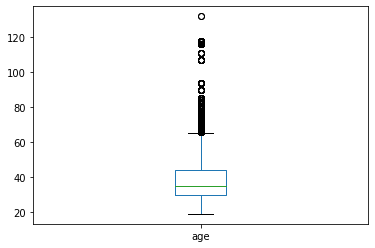

In [97]:
df['age'].plot(kind = 'box')

In [0]:
df['age_bracket'] = pd.cut(df['age'],bins = [0,20,30,40,50,60,70,80,np.inf], labels = ['0-20','20-30','30-40','40-50','50-60','60-70','70-80','80+'])

In [100]:
df['age_bracket'].value_counts()

30-40    181790
20-30    122457
40-50     88180
50-60     44872
60-70     11196
0-20       2443
70-80      1533
80+         688
Name: age_bracket, dtype: int64

In [102]:
df['age_bracket'].value_counts(dropna = False).to_frame()

,age_bracket
30-40,181790
20-30,122457
40-50,88180
NaN,66541
50-60,44872
60-70,11196
0-20,2443
70-80,1533
80+,688


In [0]:
df = df.query('age < 90')

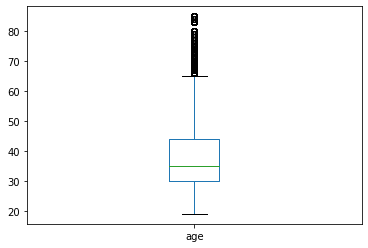

In [108]:
df['age'].plot(kind = 'box')

In [110]:
px.histogram(df, x= 'start_month_name')

In [111]:
px.histogram(df, x= 'start_hour')

In [112]:
px.histogram(df, x= 'end_hour')

In [113]:
px.histogram(df, x= 'start_day_name')